In [1]:
import os
import numpy as np
import librosa
import librosa.display
import IPython.display as ipd
import matplotlib.pyplot as plt
from pydub import AudioSegment
from scipy.spatial.distance import euclidean

In [2]:
original_song = "audio/New Sample Audio/Extracted Voices/Original Audio [vocals].mp3"
user_song = "audio/New Sample Audio/Extracted Voices/Theek Audio [vocals].mp3"
#original_song = "audio/Vocals of original song.mp3"
#user_song = "audio/Vocals of user.mp3"

In [3]:
ipd.Audio(original_song)

In [4]:
ipd.Audio(user_song)

In [5]:
original_audio, original_sr = librosa.load(original_song, sr=None)
user_audio, user_sr = librosa.load(user_song, sr = None)

In [6]:
original_pitch, original_magnitudes = librosa.core.piptrack(y=original_audio, sr=original_sr)
user_pitch, user_magnitudes = librosa.core.piptrack(y=user_audio, sr=user_sr)

In [7]:
original_magnitudes

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [8]:
dominant_pitch_ori = np.argmax(original_magnitudes, axis=0)
times_ori = librosa.times_like(dominant_pitch_ori, sr=original_sr, hop_length=len(original_audio)//len(dominant_pitch_ori))

In [9]:
dominant_pitch_user = np.argmax(user_magnitudes, axis=0)
times_user = librosa.times_like(dominant_pitch_user, sr=user_sr, hop_length=len(user_audio)//len(dominant_pitch_user))

In [10]:
original_audio

array([-1.5252570e-04, -2.0078696e-04, -1.1446105e-04, ...,
       -3.2658869e-04,  5.3200492e-05,  6.6001818e-04], dtype=float32)

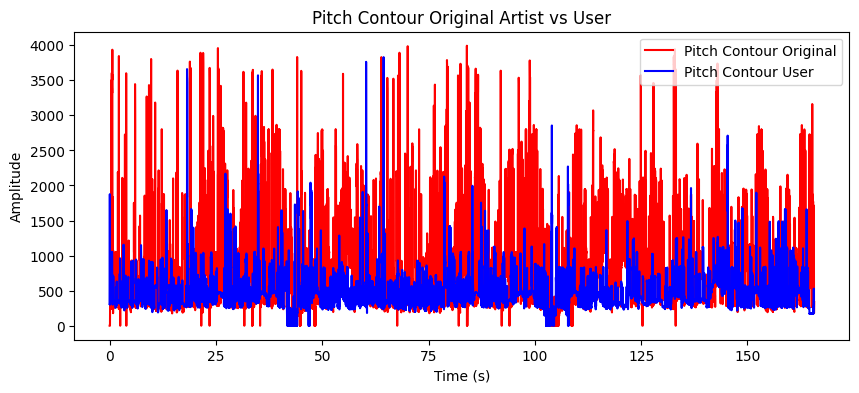

In [11]:
plt.figure(figsize=(10, 4))

plt.plot(times_ori, original_pitch[dominant_pitch_ori, range(len(dominant_pitch_ori))], label='Pitch Contour Original', color='r')
plt.plot(times_user, user_pitch[dominant_pitch_user, range(len(dominant_pitch_user))], label='Pitch Contour User', color='b')
plt.title('Pitch Contour Original Artist vs User')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.legend()
plt.show()

In [12]:
def extract_vibrato_features(pitch_track, sr):
    pitch_mean = np.mean(pitch_track)
    pitch_std = np.std(pitch_track)
    vibrato_rate = pitch_std / sr
    vibrato_depth = pitch_std / pitch_mean

    return vibrato_rate, vibrato_depth


def compare_vibrato_features(user_features, artist_features):
   
    user_features_normalized = user_features / np.linalg.norm(user_features)
    artist_features_normalized = artist_features / np.linalg.norm(artist_features)
    distance = euclidean(user_features_normalized, artist_features_normalized)
    return distance

In [13]:
user_vibrato_rate, user_vibrato_depth = extract_vibrato_features(dominant_pitch_user, user_sr)
artist_vibrato_rate, artist_vibrato_depth = extract_vibrato_features(dominant_pitch_ori, original_sr)


distance = compare_vibrato_features(np.array([user_vibrato_rate, user_vibrato_depth]),
                                     np.array([artist_vibrato_rate, artist_vibrato_depth]))

print(f"Vibrato Rate for User: {user_vibrato_rate} Hz, Depth: {user_vibrato_depth}")
print(f"Vibrato Rate for Artist: {artist_vibrato_rate} Hz, Depth: {artist_vibrato_depth}")
print(f"Euclidean Distance between user and artist vibrato features: {distance}")

Vibrato Rate for User: 0.00030058875588905433 Hz, Depth: 0.575310453156574
Vibrato Rate for Artist: 0.0007159354936563954 Hz, Depth: 0.8276181394799601
Euclidean Distance between user and artist vibrato features: 0.0003425742166840658


In [16]:
np.array([user_vibrato_rate, user_vibrato_depth])

array([3.00588756e-04, 5.75310453e-01])

In [17]:
np.array([artist_vibrato_rate, artist_vibrato_depth])

array([7.15935494e-04, 8.27618139e-01])

In [18]:
user_vibrato_rate, 

(0.00030058875588905433,)

In [19]:
user_vibrato_depth

0.575310453156574

In [20]:
artist_vibrato_rate

0.0007159354936563954

In [21]:
artist_vibrato_depth

0.8276181394799601

In [22]:
user_pitch

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [23]:
original_pitch

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [24]:
original_magnitudes

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [25]:
dominant_pitch_ori

array([ 0,  0,  0, ..., 32, 16, 16], dtype=int64)

In [28]:
dominant_pitch_user

array([14, 15, 15, ..., 11, 11, 17], dtype=int64)

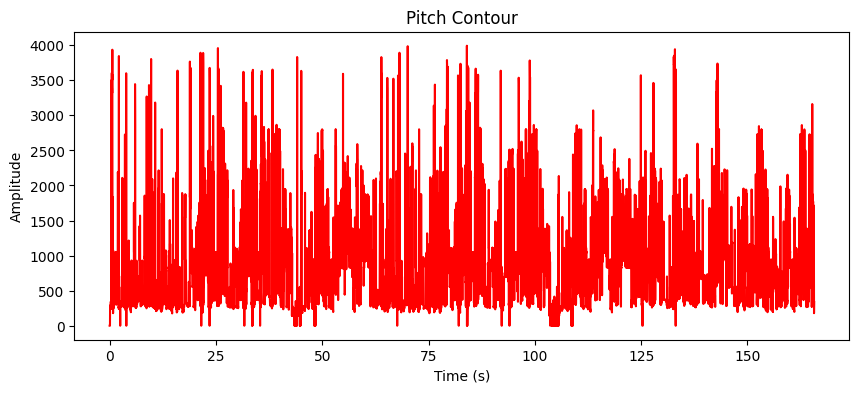

In [18]:
plt.figure(figsize=(10, 4))

plt.plot(times_ori, original_pitch[dominant_pitch_ori, range(len(dominant_pitch_ori))], label='Pitch Contour Original', color='r')
plt.title('Pitch Contour')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
#plt.legend()
plt.savefig('Pitch _Contour_of_original_artist.jpg')
plt.show()

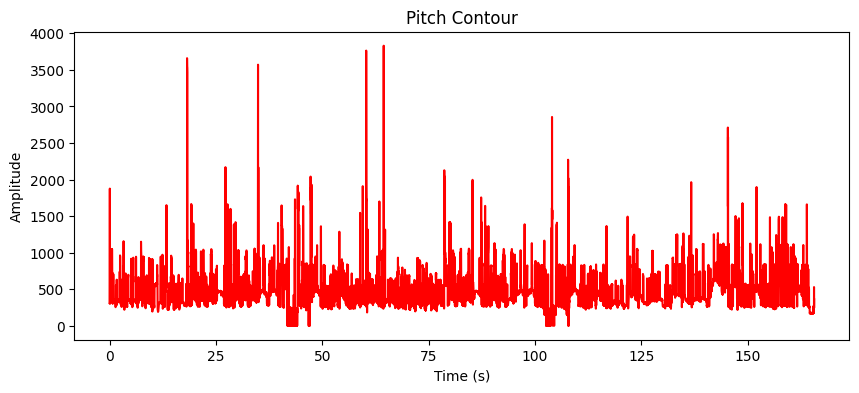

In [19]:
plt.figure(figsize=(10, 4))
plt.plot(times_user, user_pitch[dominant_pitch_user, range(len(dominant_pitch_user))], label='Pitch Contour User', color='r')
plt.title('Pitch Contour')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
#plt.legend()
plt.savefig('Pitch _Contour_of_user.jpg')
plt.show()